In [1]:
from google.colab import drive
drive.mount('/content/ShardDrives/', force_remount=True)

Mounted at /content/ShardDrives/


<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
          Sommaire
        </h1>
    </div>
</div>

- **[Preparation du dataset](#pre)**

- **[Verification des annotations](#ve)**

- **[Yolor entrainement](#en)**

- **[Resultat](#re)**

- **[Test du modele](#te)**


In [2]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageDraw
import os

<a name='pre'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
          Preparation du datatset
        </h1>
    </div>
</div>

In [3]:
!rm -rf /content/bloods

In [ ]:
!unzip /content/ShardDrives/MyDrive/bloods/blood_dataset_yolo.zip -d /content/

In [5]:
!git clone https://github.com/roboflow-ai/yolor

Cloning into 'yolor'...
remote: Enumerating objects: 387, done.
remote: Total 387 (delta 0), reused 0 (delta 0), pack-reused 387
Receiving objects: 100% (387/387), 2.97 MiB | 4.65 MiB/s, done.
Resolving deltas: 100% (174/174), done.


In [6]:
cd /content/yolor/

/content/yolor


In [7]:
!git reset --hard eb3ef0b7472413d6740f5cde39beb1a2f5b8b5d1

HEAD is now at eb3ef0b indentation


In [8]:
!pip install -qr requirements.txt

     |████████████████████████████████| 596 kB 13.1 MB/s 
     |████████████████████████████████| 776.7 MB 3.5 kB/s 
     |████████████████████████████████| 12.7 MB 25.0 MB/s 
     |████████████████████████████████| 1.5 MB 81.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.12.0 requires torch==1.11.0, but you have torch 1.7.0 which is incompatible.
torchaudio 0.11.0+cu113 requires torch==1.11.0, but you have torch 1.7.0 which is incompatible.


In [9]:
!git clone https://github.com/JunnYu/mish-cuda

Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 2.68 MiB/s, done.
Resolving deltas: 100% (56/56), done.


In [10]:
cd mish-cuda

/content/yolor/mish-cuda


In [11]:
!git reset --hard 6f38976064cbcc4782f4212d7c0c5f6dd5e315a8

HEAD is now at 6f38976 Update README.md


In [12]:
!python setup.py build install

/usr/lib/python3.7/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/mish_cuda.egg-info/SOURCES.txt'
/usr/local/lib/python3.7/dist-packages/torch/utils/cpp_extension.py:339: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
adding license file 'LICENSE'
writing manifest file 'src/mish

In [13]:
cd ..

/content/yolor


In [14]:
!git clone https://github.com/fbcotter/pytorch_wavelets

Cloning into 'pytorch_wavelets'...
remote: Enumerating objects: 972, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 972 (delta 75), reused 89 (delta 45), pack-reused 836
Receiving objects: 100% (972/972), 6.80 MiB | 9.78 MiB/s, done.
Resolving deltas: 100% (659/659), done.


In [15]:
cd pytorch_wavelets

/content/yolor/pytorch_wavelets


In [16]:
!pip install .

Processing /content/yolor/pytorch_wavelets
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
  Created wheel for pytorch-wavelets: filename=pytorch_wavelets-1.3.0-py3-none-any.whl size=54869 sha256=2f0ea7c127c9cdeaccf29e7903e08315fb6c6fd3cf5ffa43427f14dbae911c99
  Stored in directory: /tmp/pip-ephem-wheel-cache-6gvg3aee/wheels/68/d6/0a/629cb6c68e1577155ab73a47758996d9ab26f15ba622561e28
Successfully built pytorch-wavelets


In [17]:
cd ..

/content/yolor


In [19]:
!cp -avr /content/ShardDrives/MyDrive/bloods/blood.yaml /content/yolor/data/blood.yaml

'/content/ShardDrives/MyDrive/bloods/blood.yaml' -> '/content/yolor/data/blood.yaml'


In [ ]:
# !cp -avr /content/ShardDrives/MyDrive/bloods/yolov5l.yaml /content/yolov5/models/yolov5l.yaml

'/content/ShardDrives/MyDrive/bloods/yolov5l.yaml' -> '/content/yolov5/models/yolov5l.yaml'


In [ ]:
# !cp -avr /content/ShardDrives/MyDrive/dogs/yolov5l.yaml /content/yolov5/models/yolov5l.yaml

'/content/ShardDrives/MyDrive/dogs/yolov5l.yaml' -> '/content/yolov5/models/yolov5l.yaml'


In [20]:
pwd

'/content/yolor'

In [21]:
lymp_list = ['basophil','erythroblast','lymphocyte','neutrophil','eosinophil','monocyte']
class_name_to_id_mapping = {}
for i, elem in enumerate(lymp_list):
    class_name_to_id_mapping[elem] = i
print(class_name_to_id_mapping)

{'basophil': 0, 'erythroblast': 1, 'lymphocyte': 2, 'neutrophil': 3, 'eosinophil': 4, 'monocyte': 5}


In [22]:
cd ..

/content


In [23]:
pwd

'/content'

In [24]:
cd /content/blood_dataset_yolo/

/content/blood_dataset_yolo


In [ ]:
annotations = [os.path.join('/content/blood_dataset_yolo/labels/train', x) for x in os.listdir('/content/blood_dataset_yolo/labels/train') if x[-3:] == "txt"]
annotations

In [26]:
import os
import sys
annotation_list = []
# directory = os.path.dirname(os.path.realpath(sys.argv[0])) #get the directory of your script
for subdir, dirs, files in os.walk('/content/blood_dataset_yolo/labels/train'):
    for filename in files:
        subdirectoryPath = os.path.relpath(subdir, 'labels') #get the path to your subdirectory
        filePath = os.path.join(subdirectoryPath, filename) #get the path to your file
#         annotations.append('./Annotation/'+filename+'.xml')
#         path = '/media/ismail/Elements/formation/projet7/standford_dogs_dataset_yolo/labels/'+ subdirectoryPath+'/'
        if(filename.find('.txt') > 0):
            annotation_list.append('/content/blood_dataset_yolo/labels/'+filePath.replace('..',''))
#         print(subdirectoryPath)
#         print(filename.find('.xml'))

print(len(annotation_list))

9470


In [ ]:
annotation_list

<a name='ve'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
          Verification des annotations
        </h1>
    </div>
</div>

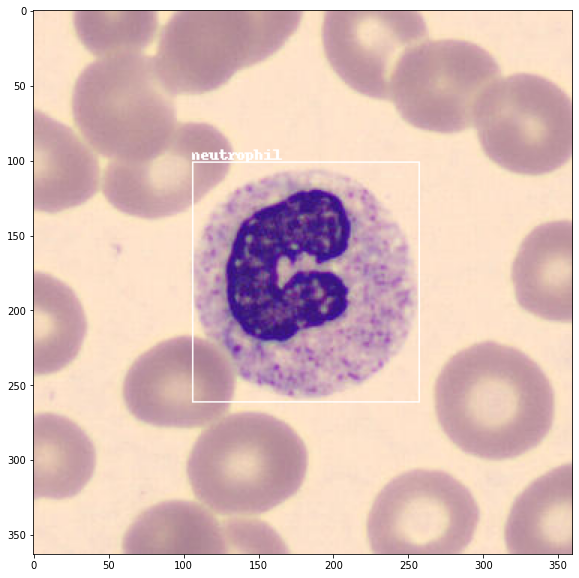

In [28]:
import random
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt
random.seed(0)

class_id_to_name_mapping = dict(zip(class_name_to_id_mapping.values(), class_name_to_id_mapping.keys()))

def plot_bounding_box(image, annotation_list):
    annotations = np.array(annotation_list)
    w, h = image.size
    
    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h 
    
    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]
    
    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        plotted_image.rectangle(((x0,y0), (x1,y1)))
        
        plotted_image.text((x0, y0 - 10), class_id_to_name_mapping[(int(obj_cls))])
    
    plt.imshow(np.array(image))
    plt.show()

# Get any random annotation file 
annotation_file = random.choice(annotations)
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

#Get the corresponding image file
image_file = annotation_file.replace("labels", "images").replace("txt", "jpg")
# assert os.path.exists(image_file)

#Load the image
image = Image.open(image_file)
fig = plt.figure(figsize=(12,10))
#Plot the Bounding Box
plot_bounding_box(image, annotation_list)

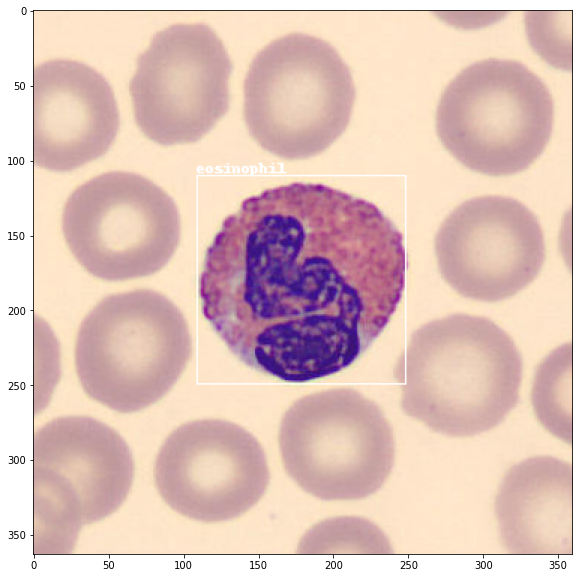

In [29]:
annotation_file = random.choice(annotations)
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

#Get the corresponding image file
image_file = annotation_file.replace("labels", "images").replace("txt", "jpg")
# assert os.path.exists(image_file)

#Load the image
image = Image.open(image_file)
fig = plt.figure(figsize=(12,10))
#Plot the Bounding Box
plot_bounding_box(image, annotation_list)

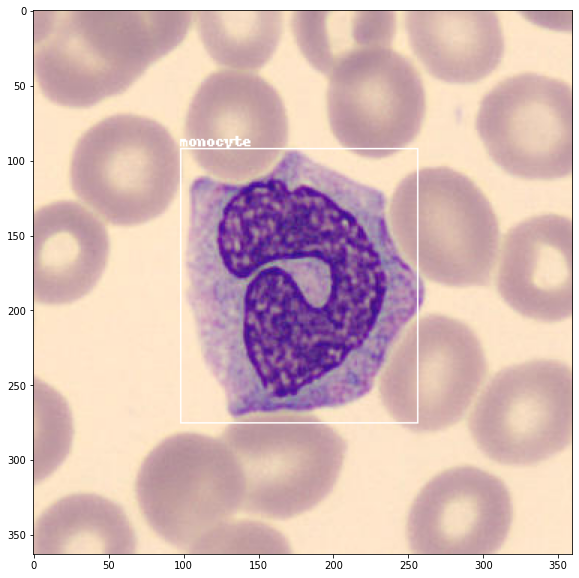

In [30]:
annotation_file = random.choice(annotations)
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

#Get the corresponding image file
image_file = annotation_file.replace("labels", "images").replace("txt", "jpg")
# assert os.path.exists(image_file)

#Load the image
image = Image.open(image_file)
fig = plt.figure(figsize=(12,10))
#Plot the Bounding Box
plot_bounding_box(image, annotation_list)

In [31]:
cd /content/yolor/ 

/content/yolor


In [32]:
!pwd

/content/yolor


In [33]:
!cp -avr /content/ShardDrives/MyDrive/bloods/blood.yaml /content/yolor/data/blood.yaml

'/content/ShardDrives/MyDrive/bloods/blood.yaml' -> '/content/yolor/data/blood.yaml'


In [34]:
!cp -avr /content/ShardDrives/MyDrive/bloods/blood.names /content/yolor/data/blood.names

'/content/ShardDrives/MyDrive/bloods/blood.names' -> '/content/yolor/data/blood.names'


In [35]:
!cp -avr  /content/ShardDrives/MyDrive/roadsign/yolor/plots.py /content/yolor/utils/plots.py

'/content/ShardDrives/MyDrive/roadsign/yolor/plots.py' -> '/content/yolor/utils/plots.py'


In [63]:
!cp -avr  /content/ShardDrives/MyDrive/roadsign/yolor/yolor_p6.pt /content/yolor/yolor_p6.pt

'/content/ShardDrives/MyDrive/roadsign/yolor/yolor_p6.pt' -> '/content/yolor/yolor_p6.pt'


In [70]:
!cp -avr   /content/yolor/runs/train/yolor_p6/weights/best.pt /content/ShardDrives/MyDrive/roadsign/yolor/yolor_blood_model.pt

'/content/yolor/runs/train/yolor_p6/weights/best.pt' -> '/content/ShardDrives/MyDrive/roadsign/yolor/yolor_blood_model.pt'


In [37]:
!rm -rf /content/yolor/runs/train

In [ ]:
# !pip install wandb
# !wandb login

<a name='en'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
          Yolor entrainement
        </h1>
    </div>
</div>

In [64]:
!python train.py --batch-size 16 --img 384 384 --data '/content/yolor/data/blood.yaml' --cfg cfg/yolor_p6.cfg --weights '/content/yolor/yolor_p6.pt' --device 0 --name yolor_p6 --hyp '/content/yolor/data/hyp.scratch.640.yaml' --epochs 50

Using torch 1.7.0 CUDA:0 (Tesla V100-SXM2-16GB, 16160MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=False, cfg='cfg/yolor_p6.cfg', data='/content/yolor/data/blood.yaml', device='0', epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='/content/yolor/data/hyp.scratch.640.yaml', image_weights=False, img_size=[384, 384], local_rank=-1, log_imgs=16, multi_scale=False, name='yolor_p6', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/yolor_p6', single_cls=False, sync_bn=False, total_batch_size=16, weights='/content/yolor/yolor_p6.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
NumExpr defaulting to 8 threads.
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.3, 'cls_pw': 1.0, 'obj': 0.7, 'obj_pw': 1.0, 

In [83]:
%load_ext tensorboard

In [85]:
%tensorboard --logdir  runs/train

<IPython.core.display.Javascript object>

In [ ]:
!tensorboard --logdir runs/train --bind_all

In [ ]:
!pip install wandb

https://wandb.ai/ismail-azdad/YOLOR/reports/Untitled-Report--VmlldzoxOTQwNzM2?accessToken=brj4pqqvv77kw0toqz7056k3kjzgz35a02o7nxfaqjlt03751x1estetkbx0y145

In [39]:
pwd

'/content/yolor'

<a name='re'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
          Resultat
        </h1>
    </div>
</div>

In [66]:
!python test.py --names '/content/yolor/data/blood.names' --data '/content/yolor/data/blood.yaml' --img 384 --batch 32 --conf 0.001 --iou 0.65 --device 0 --weights runs/train/yolor_p6/weights/best.pt --name test --verbose

Namespace(augment=False, batch_size=32, cfg='cfg/yolor_p6.cfg', conf_thres=0.001, data='/content/yolor/data/blood.yaml', device='0', exist_ok=False, img_size=384, iou_thres=0.65, name='test', names='/content/yolor/data/blood.names', project='runs/test', save_conf=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=True, weights=['runs/train/yolor_p6/weights/best.pt'])
Using torch 1.7.0 CUDA:0 (Tesla V100-SXM2-16GB, 16160MB)

Model Summary: 665 layers, 37265016 parameters, 37265016 gradients, 81.564040600 GFLOPS
Scanning labels /content/blood_dataset_yolo/labels/val.cache3 (1183 found, 0 missing, 0 empty, 0 duplicate, for 1183 images): 1183it [00:00, 15306.03it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 37/37 [00:06<00:00,  5.63it/s]
                 all    1.18e+03    1.25e+03       0.843       0.988       0.991       0.965
            basophil    1.18e+03         108       0.929       0.981       0.99

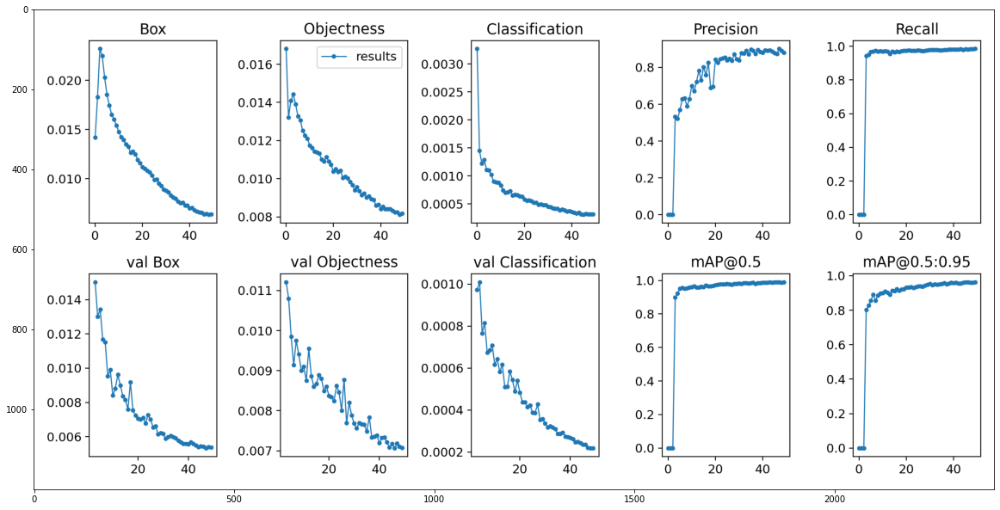

In [67]:
plt.figure(figsize=(20,20)) 
plt.imshow(np.array(Image.open("/content/yolor/runs/train/yolor_p6/results.png")))

In [ ]:
plt.figure(figsize=(20,20)) 
plt.imshow(np.array(Image.open("/content/yolor/runs/train/yolor_p6/results.png")))

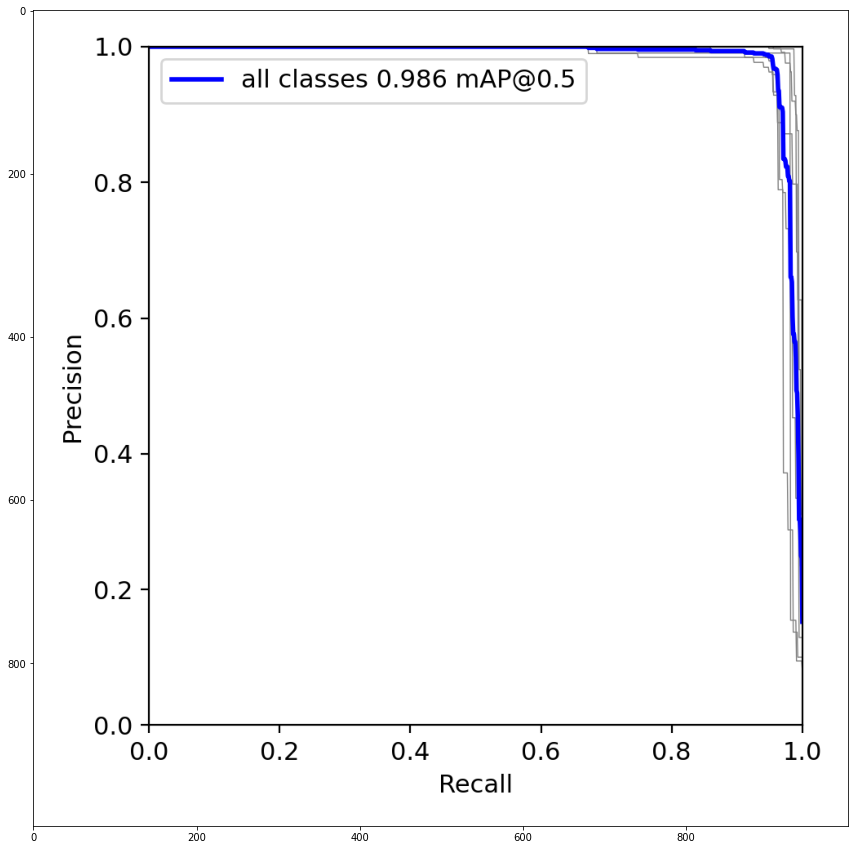

In [41]:
plt.figure(figsize=(15,15)) 
plt.imshow(np.array(Image.open("/content/yolor/runs/test/test/precision-recall_curve.png")))

<a name='te'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
          Test du modele
        </h1>
    </div>
</div>

In [ ]:
!python detect.py --img 384 --device 0 --conf 0.30  --names '/content/yolor/data/blood.names'  --source /content/blood_dataset_yolo/images/test/ --weights /content/ShardDrives/MyDrive/roadsign/yolor/yolor_blood_model.pt 

In [55]:
def show_images_from_directory(path, num_sample):
    fig = plt.figure(figsize=(30,50))
    fig.patch.set_facecolor('#377AB7')
    # print(random.choice[0:100])
    images = os.listdir(path + "/" )[:num_sample]
    for i in range(num_sample):
        img = imgmp.imread(path+"/"+images[i])
        plt.subplot(num_sample/num_sample+1, num_sample, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show() 

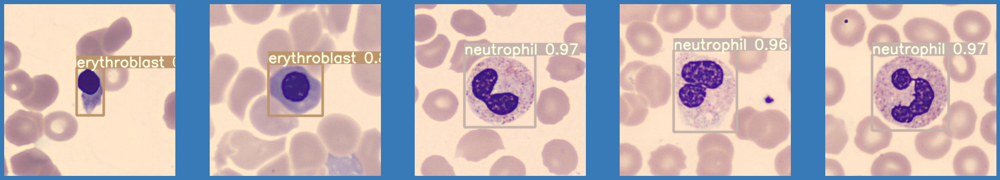

In [56]:
import matplotlib.image as imgmp
sign_list =['basophil','erythroblast','lymphocyte','neutrophil','eosinophil','monocyte']
show_images_from_directory("/content/yolor/inference/output", 5)

In [57]:
import os
from PIL import Image, ImageDraw
import random
import numpy as np
import matplotlib.pyplot as plt
detections_dir = "/content/yolor/inference/output"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]


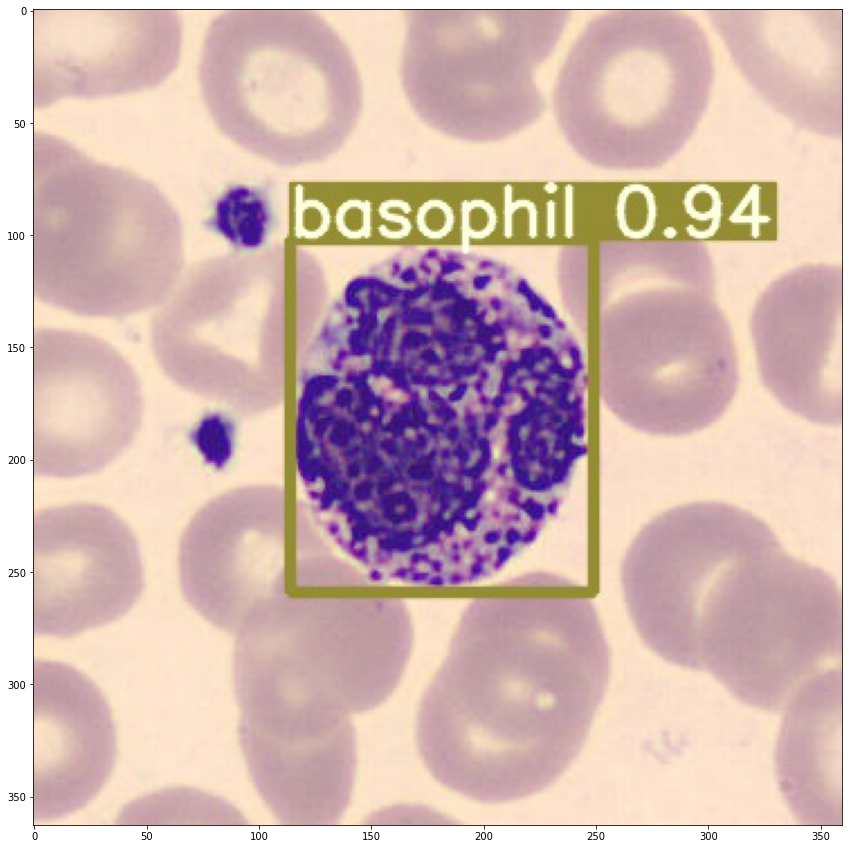

In [58]:
plt.figure(figsize=(15,15))
random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))

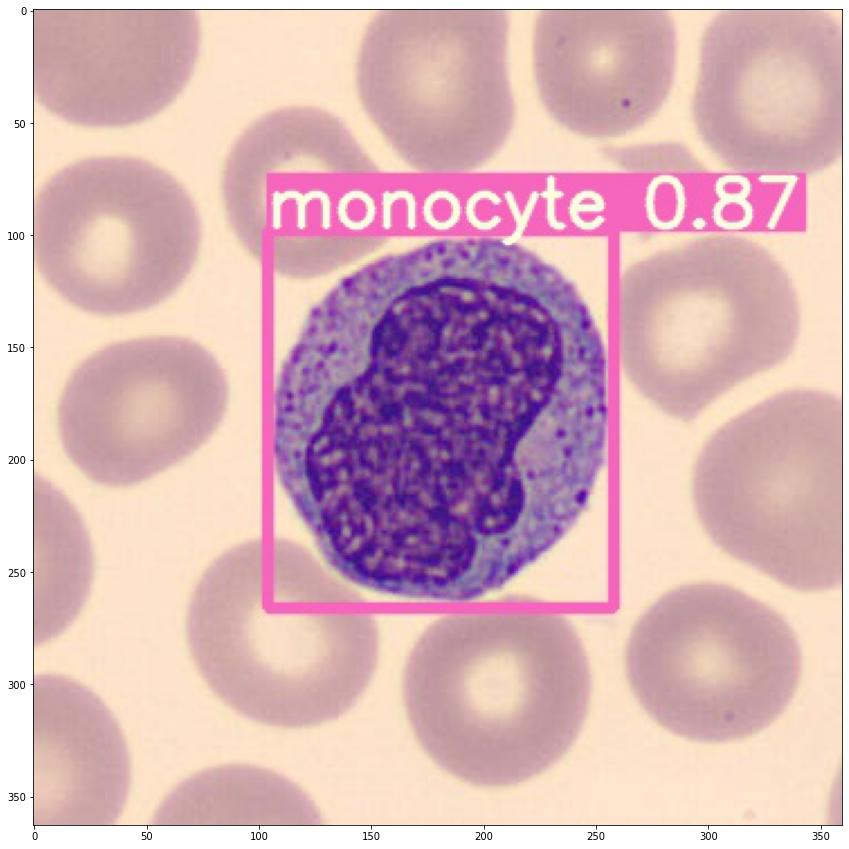

In [59]:
random.seed(15)
plt.figure(figsize=(15,15))
random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))

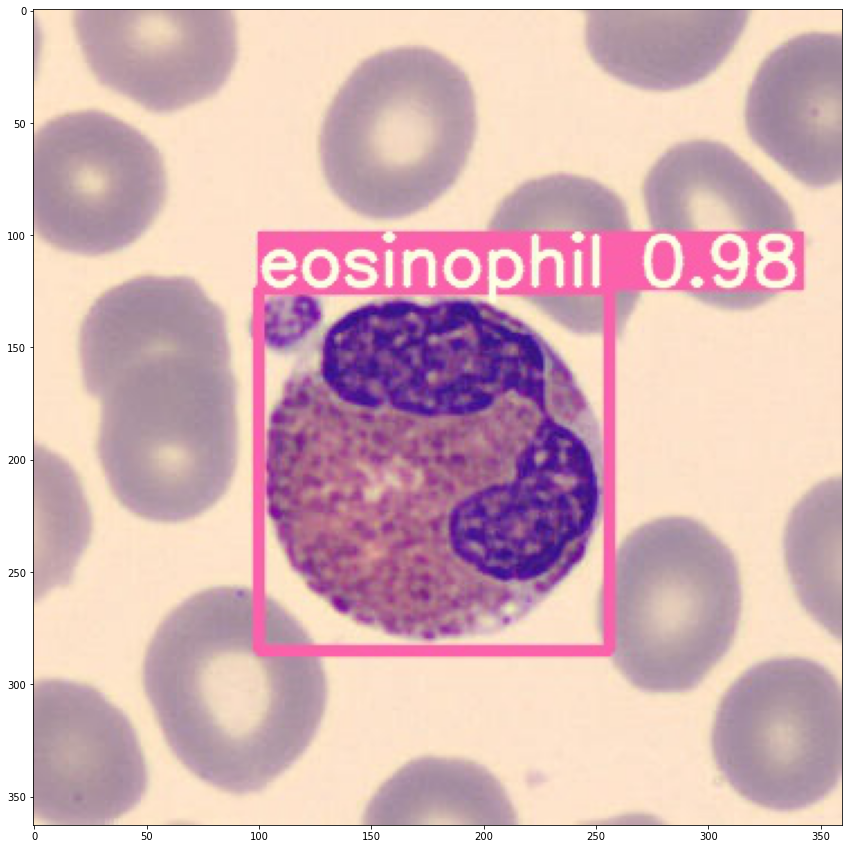

In [60]:
plt.figure(figsize=(15,15))
random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))

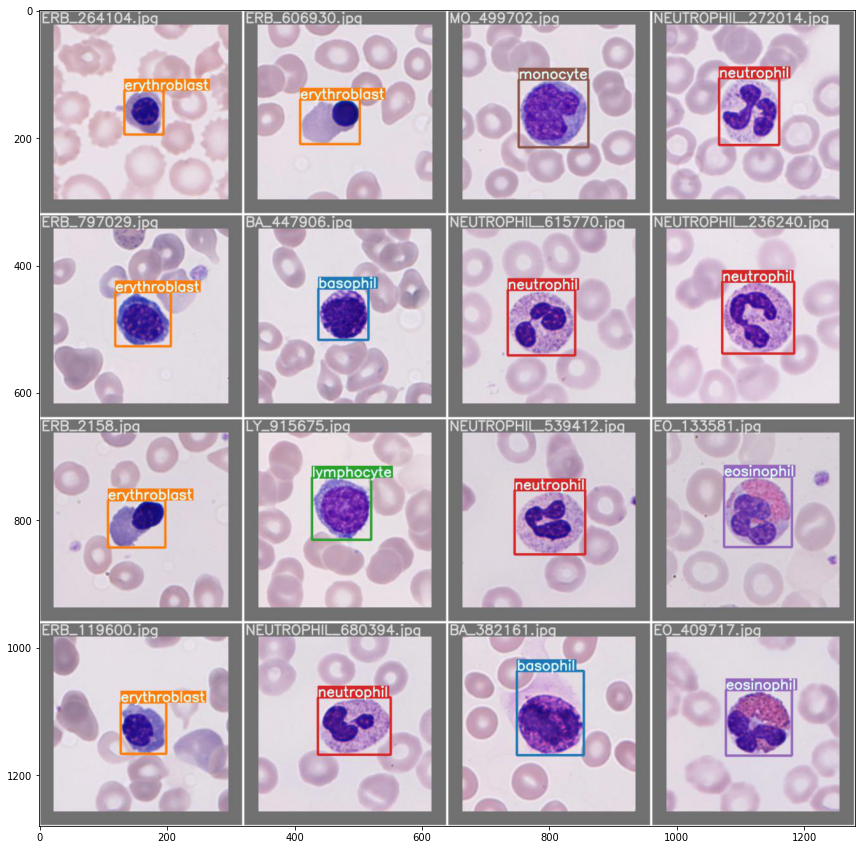

In [73]:
plt.figure(figsize=(15,15)) 
plt.imshow(np.array(Image.open("/content/yolor/runs/test/test3/test_batch0_labels.jpg")))

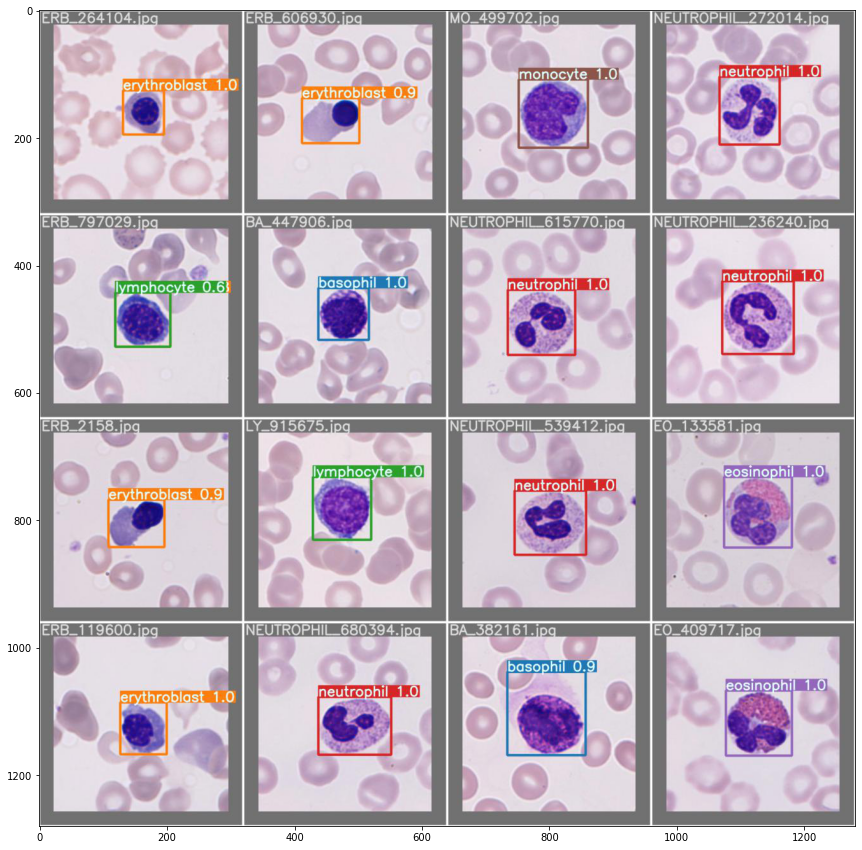

In [75]:
plt.figure(figsize=(15,15)) 
plt.imshow(np.array(Image.open("/content/yolor/runs/test/test3/test_batch0_pred.jpg")))

In [76]:
!cp -avr   /content/yolor/runs/train/yolor_p6/ /content/ShardDrives/MyDrive/bloods/blood_result_yolor

'/content/yolor/runs/train/yolor_p6/' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor'
'/content/yolor/runs/train/yolor_p6/events.out.tfevents.1651596826.87a07b06a887.967.0' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor/events.out.tfevents.1651596826.87a07b06a887.967.0'
'/content/yolor/runs/train/yolor_p6/weights' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor/weights'
'/content/yolor/runs/train/yolor_p6/weights/init.pt' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor/weights/init.pt'
'/content/yolor/runs/train/yolor_p6/weights/last.pt' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor/weights/last.pt'
'/content/yolor/runs/train/yolor_p6/weights/best.pt' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor/weights/best.pt'
'/content/yolor/runs/train/yolor_p6/weights/best_overall.pt' -> '/content/ShardDrives/MyDrive/bloods/blood_result_yolor/weights/best_overall.pt'
'/content/yolor/runs/train/yolor_p6/weights/best_p.pt' -> '/